# Imports

In [1]:
#for data upload
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img

In [2]:
#to build model
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Flatten, Conv2D, Conv2DTranspose, LeakyReLU, BatchNormalization, Input, Dense, Reshape, Activation, ReLU

In [3]:
#for decoder
import tensorflow.keras.backend as K

In [4]:
import numpy as np
import pandas as pd

In [5]:
#for compilng
from tensorflow.keras.optimizers import Adam

In [6]:
#required to monitor model performance
from tensorflow.keras.callbacks import ModelCheckpoint

In [7]:
# Use Matplotlib for visuals
import matplotlib.pyplot as plt


In [8]:
#for latent space loading and predicting
from tqdm.notebook import trange, tqdm

In [9]:
import os

In [10]:
# TensorFlow and tf.keras
import tensorflow as tf

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt

print(tf.__version__)

2.5.0


In [11]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

# Upload Data

In [12]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [13]:
train_datagen = ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)

In [14]:
# Load images
img_height = 256
img_width = 256
channels = 3
batch_size = 16

In [15]:
test_datagen = ImageDataGenerator(rescale=1./255, validation_split = 0.2)

In [16]:
#note: image classes are defined by the folders they are in. so there needs to be one layer of subfolder below the one stated here for this code to work
training_set = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Curl_Types_Consolidated/',
    target_size = (img_height, img_width),
    batch_size = 16,
    class_mode = 'input',
    #class_mode = 'categorical',  try this for prediction if above doesn't work
    subset = 'training',
    shuffle=True)

Found 2889 images belonging to 8 classes.


In [17]:
validation_set = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Validation_Curl_types_Consolidation/',
     target_size = (img_height, img_width),
     batch_size = 16,
     class_mode = 'input',
     )

Found 413 images belonging to 8 classes.


# Make Model

In [18]:
# Define the autoencoder
input_model = Input(shape=(img_height, img_width, channels))

In [19]:
# Encoder layers
encoder = Conv2D(32, (3,3), padding='same', kernel_initializer='normal')(input_model)
encoder = ReLU()(encoder)
encoder = BatchNormalization(axis=-1)(encoder)

encoder = Conv2D(64, (3,3), padding='same', kernel_initializer='normal')(encoder)
encoder = ReLU()(encoder)
encoder = BatchNormalization(axis=-1)(encoder)

encoder = Conv2D(64, (3,3), padding='same', kernel_initializer='normal')(encoder)
encoder = ReLU()(encoder)
encoder = BatchNormalization(axis=-1)(encoder)

encoder = Conv2D(64, (3,3), padding='same', kernel_initializer='normal')(input_model)
encoder = ReLU()(encoder)
encoder = BatchNormalization(axis=-1)(encoder)

encoder_dim = K.int_shape(encoder)
encoder = Flatten()(encoder)

In [20]:
# Latent Space
latent_space = Dense(16, name='latent_space')(encoder)

In [21]:
# Decoder Layers
decoder = Dense(np.prod(encoder_dim[1:]))(latent_space)
decoder = Reshape((encoder_dim[1], encoder_dim[2], encoder_dim[3]))(decoder)

decoder = Conv2DTranspose(64, (3,3), padding='same', kernel_initializer='normal')(decoder)
#decoder = LeakyReLU()(decoder)
decoder = ReLU()(decoder)
decoder = BatchNormalization(axis=-1)(decoder)

decoder = Conv2DTranspose(64, (3,3), padding='same', kernel_initializer='normal')(decoder)
#decoder = LeakyReLU()(decoder)
decoder = ReLU()(decoder)
decoder = BatchNormalization(axis=-1)(decoder)

decoder = Conv2DTranspose(32, (3,3), padding='same', kernel_initializer='normal')(decoder)
#decoder = LeakyReLU()(decoder)
decoder = ReLU()(decoder)
decoder = BatchNormalization(axis=-1)(decoder)

decoder = Conv2DTranspose(3, (3, 3), padding="same")(decoder)
output = Activation('sigmoid', name='decoder')(decoder)


In [22]:
# Create model object
autoencoder = Model(input_model, output, name='autoencoder')

In [23]:
# Model Summary
autoencoder.summary()

Model: "autoencoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 256, 256, 64)      1792      
_________________________________________________________________
re_lu_3 (ReLU)               (None, 256, 256, 64)      0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 256, 256, 64)      256       
_________________________________________________________________
flatten (Flatten)            (None, 4194304)           0         
_________________________________________________________________
latent_space (Dense)         (None, 16)                67108880  
_________________________________________________________________
dense (Dense)                (None, 4194304)           

In [24]:
# Compile the model
#autoencoder.compile(loss="mse", optimizer= Adam(learning_rate=1e-3))
autoencoder.compile(loss="categorical_crossentropy", optimizer= Adam(learning_rate=0.0005))

In [ ]:

# Fit the model
history = autoencoder.fit(training_set,
                                    steps_per_epoch=training_set.n // batch_size,
                                    epochs=200,
                                    validation_data=validation_set,
                                    validation_steps=validation_set.n // batch_size,
                                    callbacks = [ModelCheckpoint('/content/drive/My Drive/image_autoencoder_31.h5', monitor='val_loss', verbose=0, save_best_only=True, save_weights_only=False)]
                                    )

Epoch 1/200
180/180 [==============================] - 1061s 6s/step - loss: 1.6423 - val_loss: 1.6352
Epoch 2/200
180/180 [==============================] - 153s 851ms/step - loss: 1.6270 - val_loss: 1.8798
Epoch 3/200
180/180 [==============================] - 141s 786ms/step - loss: 1.6177 - val_loss: 1.7310
Epoch 4/200
180/180 [==============================] - 140s 781ms/step - loss: 1.6146 - val_loss: 1.8873
Epoch 5/200
180/180 [==============================] - 138s 769ms/step - loss: 1.6205 - val_loss: 1.8374
Epoch 6/200
180/180 [==============================] - 140s 777ms/step - loss: 1.6227 - val_loss: 1.7504
Epoch 7/200
180/180 [==============================] - 139s 773ms/step - loss: 1.6203 - val_loss: 1.7249
Epoch 8/200
180/180 [==============================] - 138s 766ms/step - loss: 1.6250 - val_loss: 1.9081
Epoch 9/200
180/180 [==============================] - 137s 763ms/step - loss: 1.6264 - val_loss: 2.0565
Epoch 10/200
180/180 [==============================] - 1

# Model Performance



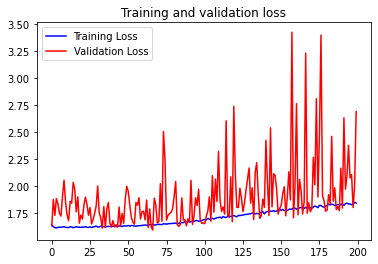

In [27]:
# Plot Accuracy and Loss
loss = history.history['loss']
#loss = history['loss']
#val_loss = history.history['val_loss']
val_loss = history.history['val_loss']
 
#epochs = range(len(loss))
epochs = range(len(val_loss))
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

# Save Model

https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/keras/save_and_load.ipynb

In [28]:
# Save the entire model to a HDF5 file.
# The '.h5' extension indicates that the model should be saved to HDF5.
autoencoder.save('/content/drive/My Drive/my_model_FP32_2.h5') 

# Predict

In [29]:
labels = (training_set.class_indices)
labels = dict((v,k) for k,v in labels.items())
#predictions = [labels[k] for k in predicted_class_indices]

In [30]:
labels

{0: 'Curling Iron Hair',
 1: 'Styled',
 2: 'coily 4',
 3: 'curly 3 and 2c',
 4: 'short',
 5: 'straight long no curl',
 6: 'straight long slight curl',
 7: 'wavy'}

In [ ]:
class_names = list(labels.values())

In [ ]:
class_names

['Curling Iron Hair',
 'Styled',
 'coily 4',
 'curly 3 and 2c',
 'short',
 'straight long no curl',
 'straight long slight curl',
 'wavy']

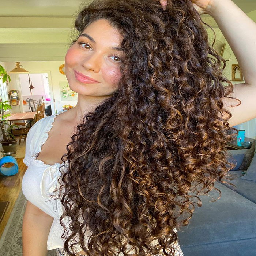

In [ ]:
# Get new prediction image
new_img_name = os.listdir('/content/drive/MyDrive/prediction_photos')[0]
new_img = load_img('/content/drive/MyDrive/prediction_photos/{}'.format( new_img_name), target_size=(256, 256))
new_img

In [ ]:
img_array = keras.preprocessing.image.img_to_array(new_img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

In [ ]:
predictions = autoencoder.predict(validation_set)
score = tf.nn.softmax(predictions[0])


In [ ]:
score

<tf.Tensor: shape=(256, 256, 3), dtype=float32, numpy=
array([[[0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334],
        ...,
        [0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334]],

       [[0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334],
        ...,
        [0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334]],

       [[0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334],
        ...,
        [0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334],
        [0.33333334, 0.33333334, 0.33333334]],

       ...,

       [[0.33333334, 0.33333334, 0.33333334],
        [0.33

In [ ]:
predictions2 = autoencoder.predict(img_array)

In [ ]:

score2 = tf.nn.softmax(predictions2[0])

In [ ]:
score2[0][0]

<tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.33333334, 0.33333334, 0.33333334], dtype=float32)>

In [ ]:
print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score2[0][0])], 100 * np.max(score[0][0]))
)

This image most likely belongs to Curling Iron Hair with a 33.33 percent confidence.


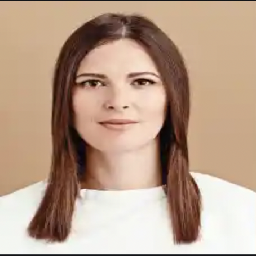

In [ ]:
# Get new prediction image
new_img_name1 = os.listdir('/content/drive/MyDrive/prediction_photos')[1]
new_img1 = load_img('/content/drive/MyDrive/prediction_photos/{}'.format( new_img_name1), target_size=(256, 256))
new_img1

In [ ]:
img_array1 = keras.preprocessing.image.img_to_array(new_img1)
img_array1 = tf.expand_dims(img_array1, 0) # Create a batch

In [ ]:
predictions1 = autoencoder.predict(img_array1)
score1 = tf.nn.softmax(predictions1[0])

In [ ]:
print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score1[0][0])], 100 * np.max(score1[0][0]))
)

This image most likely belongs to Curling Iron Hair with a 33.33 percent confidence.


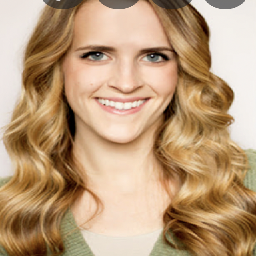

In [ ]:
# Get new prediction image
new_img_name2 = os.listdir('/content/drive/MyDrive/prediction_photos')[2]
new_img2 = load_img('/content/drive/MyDrive/prediction_photos/{}'.format( new_img_name2), target_size=(256, 256))
new_img2

In [ ]:
img_array2 = keras.preprocessing.image.img_to_array(new_img2)
img_array2 = tf.expand_dims(img_array2, 0) # Create a batch

In [ ]:
predictions2 = autoencoder.predict(img_array2)
score2 = tf.nn.softmax(predictions2[0])

In [ ]:
print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score2[0][0])], 100 * np.max(score2[0][0]))
)

This image most likely belongs to Curling Iron Hair with a 33.33 percent confidence.


# Latent Space Model

now that we have a trained model, we are going to get the latent space layer prediction for every image and export those vectors.

we are then going to compare those vectors to find similar images

In [31]:
# Create model with latent space layer
latent_space_model = Model(autoencoder.input, autoencoder.get_layer('latent_space').output)

Now every time we use the .predict() method with an image as the input of this new model, we get the Latent Space as the output.

To use this approach to get similar images, we need to predict with the latent_space_model every image, so we can compute the euclidean distance between all our saved images, and any new picture we want to find similar images.

In [32]:
import pickle

In [33]:
# Load all images and predict them with the latent space model
X = []
indices = []


for i in tqdm(range(len(os.listdir('/content/drive/MyDrive/Salon_photos_all')))):
  print(i)
  try:
    img_name = os.listdir('/content/drive/MyDrive/Salon_photos_all')[i]
    #print(img_name)
    img = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(img_name), target_size = (256, 256))
    img = img_to_array(img) / 255.0
    #print(img)
    img = np.expand_dims(img, axis=0)
    pred = latent_space_model.predict(img)
    pred = np.resize(pred, (16))
    X.append(pred)
    indices.append(img_name)

    # Export the embeddings
    #if i in [1,10,100,500,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000,12000,13000,14000,15000,16000,17000,18000,19000]:
      #embeddings = {'indices': indices, 'features': np.array(X)}

      #pickle.dump(embeddings, open('/content/drive/MyDrive/image_embeddings_9.pickle', 'wb'))

  except:
    print(img_name)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [ ]:
#X

In [ ]:
#indices

In [34]:
# Export the embeddings
embeddings = {'indices': indices, 'features': np.array(X)}

pickle.dump(embeddings, open('/content/drive/MyDrive/image_embeddings_32.pickle', 'wb'))

# Image Similarity

In [35]:
def eucledian_distance(x,y):
  eucl_dist = np.linalg.norm(x - y)
  return eucl_dist

def category_similarity(x,y):
  return SequenceMatcher(None, x, y).ratio()

In [ ]:
# Load embeddings
embeddings = pickle.load(open('/content/drive/MyDrive/image_embeddings_30.pickle', 'rb'))

# Load images metadata
#metadata = pd.read_csv('flipkart/metadata.csv')

In [36]:
embeddings

{'features': array([[ 2429.5674 ,   776.0033 , -1415.162  , ...,  2642.1912 ,
           257.7331 ,   -71.3811 ],
        [ 3496.883  , -4962.2627 ,  2886.306  , ...,   396.20197,
         -4924.407  ,  2611.3904 ],
        [ 7148.     , -2697.5469 , -6458.6885 , ...,  7363.9736 ,
          2370.1921 , -6328.864  ],
        ...,
        [-8868.683  , -4329.3477 ,  1228.6484 , ...,  3331.6118 ,
          1956.8934 , -1906.685  ],
        [-4570.035  ,  3048.231  , -1642.5398 , ...,   294.5716 ,
          5546.204  , -4406.808  ],
        [-3684.5476 ,  2753.322  ,  -947.0495 , ...,  3700.703  ,
           254.84872,  2952.1047 ]], dtype=float32),
 'indices': ['Shag Salon 2021-08-06 at 7.13.20 PM.png',
  'Shag Salon 2021-08-06 at 7.07.35 PM.png',
  'Shag Salon 2021-08-06 at 7.13.47 PM.png',
  'Shag Salon 2021-08-06 at 7.10.11 PM.png',
  'Shag Salon 2021-08-06 at 7.14.31 PM.png',
  'Shag Salon 2021-08-06 at 7.12.35 PM.png',
  'Shag Salon 2021-08-06 at 7.12.43 PM.png',
  'Shag Salon 2021-0

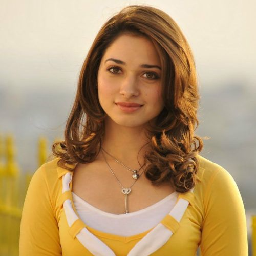

In [37]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/all_test_photos')[4]
img = load_img('/content/drive/MyDrive/all_test_photos/{}'.format(img_name), target_size=(256, 256))
img

In [38]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/all_test_photos')[4]
img = load_img('/content/drive/MyDrive/all_test_photos/{}'.format(img_name), target_size=(256, 256))

In [39]:
#for data upload
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img

[[[0.91764706 0.8745098  0.7882353 ]
  [0.91764706 0.8745098  0.7882353 ]
  [0.91764706 0.8745098  0.7882353 ]
  ...
  [0.9490196  0.90588236 0.81960785]
  [0.9490196  0.90588236 0.81960785]
  [0.9490196  0.90588236 0.81960785]]

 [[0.91764706 0.8745098  0.7882353 ]
  [0.91764706 0.8745098  0.7882353 ]
  [0.91764706 0.8745098  0.7882353 ]
  ...
  [0.9490196  0.90588236 0.81960785]
  [0.9490196  0.90588236 0.81960785]
  [0.9490196  0.90588236 0.81960785]]

 [[0.91764706 0.8745098  0.7882353 ]
  [0.91764706 0.8745098  0.7882353 ]
  [0.91764706 0.8745098  0.7882353 ]
  ...
  [0.9490196  0.90588236 0.81960785]
  [0.94509804 0.9019608  0.8156863 ]
  [0.94509804 0.9019608  0.8156863 ]]

 ...

 [[0.627451   0.5019608  0.13333334]
  [0.6313726  0.5058824  0.13725491]
  [0.6431373  0.5176471  0.14901961]
  ...
  [0.627451   0.49019608 0.1254902 ]
  [0.68235296 0.5176471  0.04313726]
  [0.70980394 0.5411765  0.03921569]]

 [[0.62352943 0.5019608  0.14509805]
  [0.627451   0.5058824  0.14901961]



0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


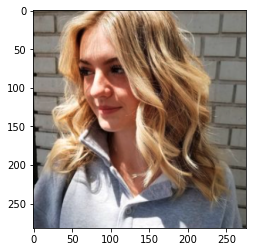

Euclidean Distance: 16927.388671875
0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


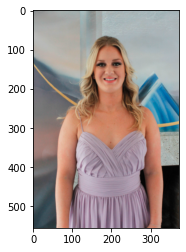

Euclidean Distance: 17027.380859375
0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


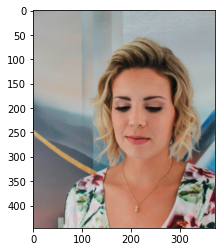

Euclidean Distance: 17045.98828125
0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


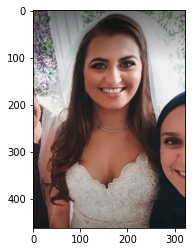

Euclidean Distance: 17503.576171875
0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


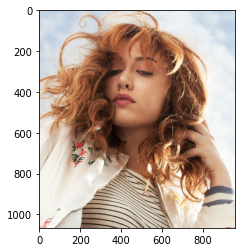

Euclidean Distance: 18876.3125
0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


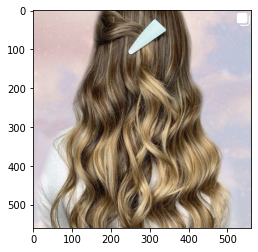

Euclidean Distance: 19076.18359375
0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


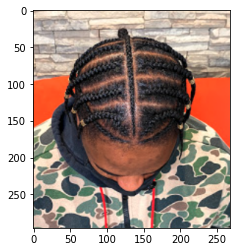

Euclidean Distance: 19154.953125
0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


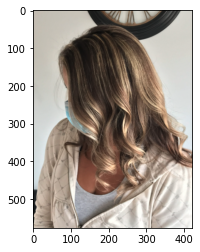

Euclidean Distance: 19177.046875
0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


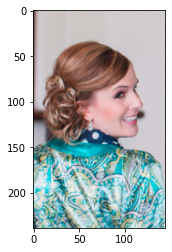

Euclidean Distance: 19193.064453125
0       Brianna Hallet Hair 2021-08-07 at 8.27.03 PM.png
1      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
2      Trinity Hair and Makeup 2021-08-07 at 7.40.09 ...
3               Bobbypinned 2021-08-07 at 7.31.29 PM.png
4         HeadKandi Salons 2021-08-06 at 10.31.47 PM.png
                             ...                        
671              Shag Salon 2021-08-06 at 7.09.05 PM.png
672      Diva Salon and Spa 2021-08-07 at 7.06.34 PM.png
673    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
674          Radiance Salon 2021-08-07 at 3.57.46 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


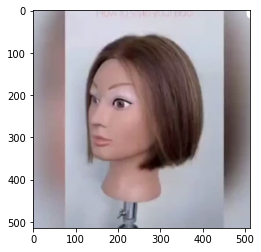

Euclidean Distance: 19218.0


In [40]:
# Calculate eucledian distance
img_similarity = []
cat_similarity = []


# Get actual image embedding
img = img_to_array(img) / 255.0
print(img)

img = np.expand_dims(img, axis=0)
pred = latent_space_model.predict(img)
pred = np.resize(pred, (16))
#img_cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
#print('Image Category: {}'.format(img_cat))


for i in tqdm(range(len(embeddings['indices']))):
  img_name = embeddings['indices'][i]

  # Calculate vectors distances
  dist = eucledian_distance(pred,embeddings['features'][i])
  img_similarity.append(dist)

  # Calculate categoy similarity
  #cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
  #cat_sim = category_similarity(img_cat, cat)
  #cat_similarity.append(cat_sim)

imgs_result = pd.DataFrame({'img': embeddings['indices'],
                            'euclidean_distance': img_similarity,
                            #'category_similarity': cat_similarity
                            }
                           )


imgs_result = imgs_result.query('euclidean_distance > 0').sort_values(by='euclidean_distance', ascending=True).reset_index(drop=True)
#imgs_result = imgs_result.iloc[0:20,:].sort_values(by='category_similarity', ascending=False).reset_index(drop=True)

# Show 10 first similar images
for i in range(10):
  image = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(imgs_result['img'].values[i]))
  #category = metadata.query("id == '{}'".format(imgs_result['img'].values[i].replace('.jpg','')))['category'].values[0]
  
  # Show image
  print(imgs_result['img'])
  plt.imshow(image)
  plt.show()
  #print('Image Category: {}'.format(category))
  print('Euclidean Distance: {}'.format(imgs_result['euclidean_distance'].values[i]))
  #print('Category Distance: {}'.format(imgs_result['category_similarity'].values[i]))



# Image Similarity - Validation Data (curly)

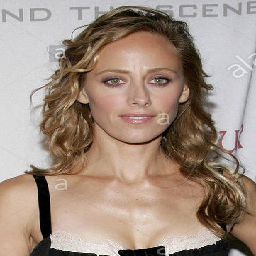

In [41]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Curly hair')[3]
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Curly hair/{}'.format(img_name), target_size=(256, 256))
img

In [42]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Curly hair')[3]
print(img_name)
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Curly hair/{}'.format(img_name), target_size=(256, 256))

oblong (120).png


In [43]:
#for data upload
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img

[[[0.78039217 0.78039217 0.7882353 ]
  [0.8117647  0.8117647  0.81960785]
  [0.7921569  0.7921569  0.8       ]
  ...
  [0.7411765  0.75686276 0.7607843 ]
  [0.7372549  0.7529412  0.75686276]
  [0.7254902  0.7411765  0.74509805]]

 [[0.7921569  0.7921569  0.8       ]
  [0.7921569  0.7921569  0.8       ]
  [0.7921569  0.7921569  0.8       ]
  ...
  [0.57254905 0.5764706  0.58431375]
  [0.57254905 0.5764706  0.58431375]
  [0.5764706  0.5803922  0.5882353 ]]

 [[0.8        0.8        0.80784315]
  [0.78039217 0.78039217 0.7882353 ]
  [0.7921569  0.7921569  0.8       ]
  ...
  [0.5568628  0.54901963 0.56078434]
  [0.54901963 0.5411765  0.5529412 ]
  [0.56078434 0.5529412  0.5647059 ]]

 ...

 [[0.80784315 0.68235296 0.6       ]
  [0.8117647  0.6862745  0.6039216 ]
  [0.8117647  0.6862745  0.6039216 ]
  ...
  [0.41960785 0.32156864 0.23529412]
  [0.45490196 0.34117648 0.2509804 ]
  [0.5137255  0.3647059  0.27450982]]

 [[0.79607844 0.67058825 0.5882353 ]
  [0.8        0.6745098  0.5921569 ]


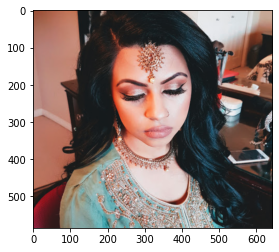

Euclidean Distance: 13920.5419921875


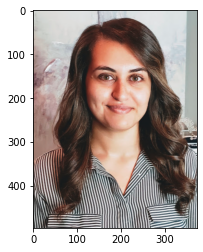

Euclidean Distance: 14422.0341796875


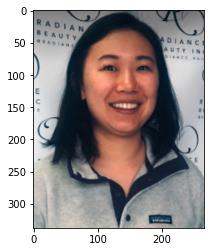

Euclidean Distance: 15301.837890625


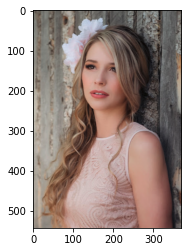

Euclidean Distance: 15527.1611328125


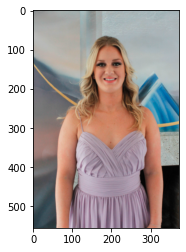

Euclidean Distance: 16191.328125


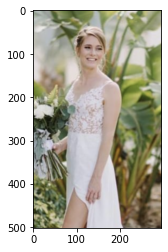

Euclidean Distance: 16665.615234375


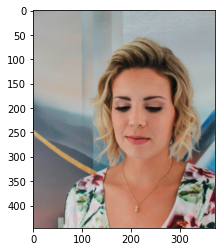

Euclidean Distance: 16686.962890625


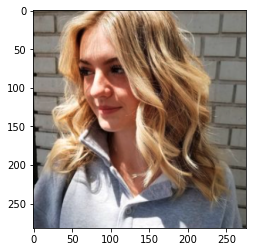

Euclidean Distance: 16838.671875


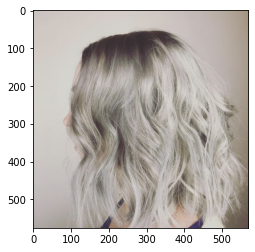

Euclidean Distance: 17220.671875


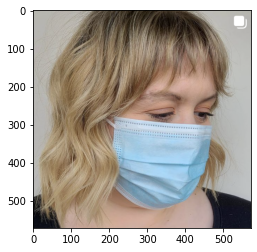

Euclidean Distance: 17320.81640625


In [44]:
# Calculate eucledian distance
img_similarity = []
cat_similarity = []


# Get actual image embedding
img = img_to_array(img) / 255.0
print(img)

img = np.expand_dims(img, axis=0)
pred = latent_space_model.predict(img)
pred = np.resize(pred, (16))
#img_cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
#print('Image Category: {}'.format(img_cat))


for i in tqdm(range(len(embeddings['indices']))):
  img_name = embeddings['indices'][i]

  # Calculate vectors distances
  dist = eucledian_distance(pred,embeddings['features'][i])
  img_similarity.append(dist)

  # Calculate categoy similarity
  #cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
  #cat_sim = category_similarity(img_cat, cat)
  #cat_similarity.append(cat_sim)

imgs_result = pd.DataFrame({'img': embeddings['indices'],
                            'euclidean_distance': img_similarity,
                            #'category_similarity': cat_similarity
                            }
                           )


imgs_result = imgs_result.query('euclidean_distance > 0').sort_values(by='euclidean_distance', ascending=True).reset_index(drop=True)
#imgs_result = imgs_result.iloc[0:20,:].sort_values(by='category_similarity', ascending=False).reset_index(drop=True)

# Show 10 first similar images
for i in range(10):
  image = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(imgs_result['img'].values[i]))
  #category = metadata.query("id == '{}'".format(imgs_result['img'].values[i].replace('.jpg','')))['category'].values[0]
  
  # Show image
  plt.imshow(image)
  plt.show()
  #print('Image Category: {}'.format(category))
  print('Euclidean Distance: {}'.format(imgs_result['euclidean_distance'].values[i]))
  #print('Category Distance: {}'.format(imgs_result['category_similarity'].values[i]))



# Image Similarity - Validation Data (straight)

In [45]:
def eucledian_distance(x,y):
  eucl_dist = np.linalg.norm(x - y)
  return eucl_dist

def category_similarity(x,y):
  return SequenceMatcher(None, x, y).ratio()

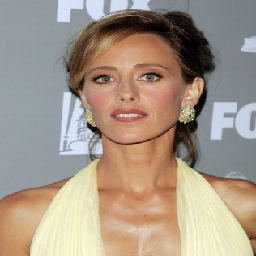

In [46]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Straight hair')[5]
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Straight hair/{}'.format(img_name), target_size=(256, 256))
img

In [47]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Straight hair')[5]
print(img_name)
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Straight hair/{}'.format(img_name), target_size=(256, 256))

oblong (121).png


In [48]:
#for data upload
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img

[[[0.5686275  0.59607846 0.61960787]
  [0.57254905 0.6        0.62352943]
  [0.5764706  0.6039216  0.627451  ]
  ...
  [0.47058824 0.49803922 0.52156866]
  [0.46666667 0.49411765 0.5176471 ]
  [0.46666667 0.49411765 0.5176471 ]]

 [[0.5764706  0.6039216  0.627451  ]
  [0.5803922  0.60784316 0.6313726 ]
  [0.5803922  0.60784316 0.6313726 ]
  ...
  [0.4745098  0.5019608  0.5254902 ]
  [0.47058824 0.49803922 0.52156866]
  [0.46666667 0.49411765 0.5176471 ]]

 [[0.5764706  0.6039216  0.627451  ]
  [0.5764706  0.6039216  0.627451  ]
  [0.5803922  0.60784316 0.6313726 ]
  ...
  [0.46666667 0.49411765 0.5176471 ]
  [0.46666667 0.49411765 0.5176471 ]
  [0.4627451  0.49019608 0.5137255 ]]

 ...

 [[0.7176471  0.50980395 0.34901962]
  [0.72156864 0.5137255  0.3529412 ]
  [0.7411765  0.53333336 0.37254903]
  ...
  [0.5019608  0.47058824 0.34509805]
  [0.32156864 0.25490198 0.15294118]
  [0.3372549  0.2627451  0.16862746]]

 [[0.70980394 0.5058824  0.34509805]
  [0.7137255  0.50980395 0.34901962]


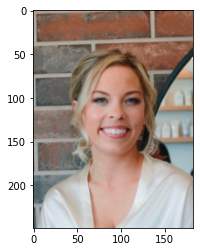

Euclidean Distance: 12926.4404296875


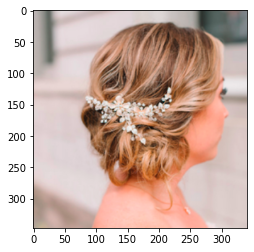

Euclidean Distance: 13538.7724609375


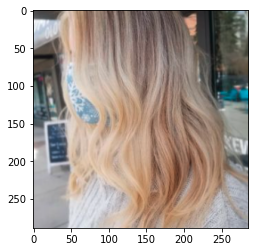

Euclidean Distance: 13897.970703125


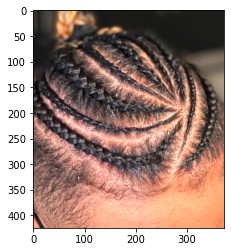

Euclidean Distance: 14572.1787109375


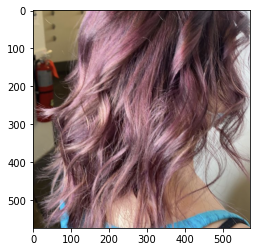

Euclidean Distance: 15834.4345703125


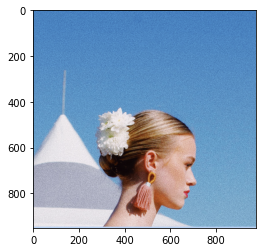

Euclidean Distance: 16166.794921875


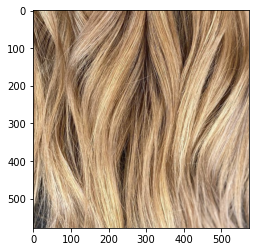

Euclidean Distance: 17029.994140625


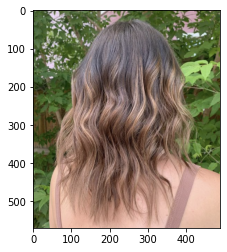

Euclidean Distance: 17036.5234375


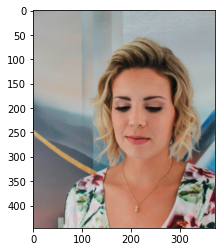

Euclidean Distance: 17182.9140625


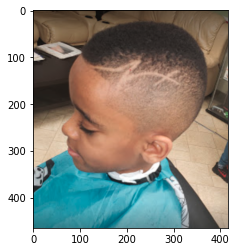

Euclidean Distance: 17580.44140625


In [49]:
# Calculate eucledian distance
img_similarity = []
cat_similarity = []


# Get actual image embedding
img = img_to_array(img) / 255.0
print(img)

img = np.expand_dims(img, axis=0)
pred = latent_space_model.predict(img)
pred = np.resize(pred, (16))
#img_cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
#print('Image Category: {}'.format(img_cat))


for i in tqdm(range(len(embeddings['indices']))):
  img_name = embeddings['indices'][i]

  # Calculate vectors distances
  dist = eucledian_distance(pred,embeddings['features'][i])
  img_similarity.append(dist)

  # Calculate categoy similarity
  #cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
  #cat_sim = category_similarity(img_cat, cat)
  #cat_similarity.append(cat_sim)

imgs_result = pd.DataFrame({'img': embeddings['indices'],
                            'euclidean_distance': img_similarity,
                            #'category_similarity': cat_similarity
                            }
                           )


imgs_result = imgs_result.query('euclidean_distance > 0').sort_values(by='euclidean_distance', ascending=True).reset_index(drop=True)
#imgs_result = imgs_result.iloc[0:20,:].sort_values(by='category_similarity', ascending=False).reset_index(drop=True)

# Show 10 first similar images
for i in range(10):
  image = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(imgs_result['img'].values[i]))
  #category = metadata.query("id == '{}'".format(imgs_result['img'].values[i].replace('.jpg','')))['category'].values[0]
  
  # Show image
  plt.imshow(image)
  plt.show()
  #print('Image Category: {}'.format(category))
  print('Euclidean Distance: {}'.format(imgs_result['euclidean_distance'].values[i]))
  #print('Category Distance: {}'.format(imgs_result['category_similarity'].values[i]))



# Image Similarity - Validation Data (straight 2)

In [50]:
def eucledian_distance(x,y):
  eucl_dist = np.linalg.norm(x - y)
  return eucl_dist

def category_similarity(x,y):
  return SequenceMatcher(None, x, y).ratio()

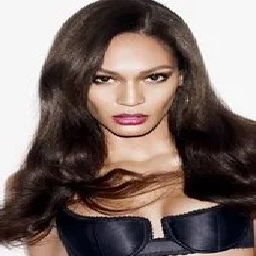

In [51]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Straight hair')[20]
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Straight hair/{}'.format(img_name), target_size=(256, 256))
img

In [52]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Straight hair')[20]
print(img_name)
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Straight hair/{}'.format(img_name), target_size=(256, 256))

oblong (141).png


In [53]:
#for data upload
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img

[[[0.9647059  0.9647059  0.9647059 ]
  [0.9647059  0.9647059  0.9647059 ]
  [0.9647059  0.9647059  0.9647059 ]
  ...
  [0.96862745 0.96862745 0.96862745]
  [0.96862745 0.96862745 0.96862745]
  [0.96862745 0.96862745 0.96862745]]

 [[0.9647059  0.9647059  0.9647059 ]
  [0.9647059  0.9647059  0.9647059 ]
  [0.9647059  0.9647059  0.9647059 ]
  ...
  [0.96862745 0.96862745 0.96862745]
  [0.96862745 0.96862745 0.96862745]
  [0.96862745 0.96862745 0.96862745]]

 [[0.9647059  0.9647059  0.9647059 ]
  [0.9647059  0.9647059  0.9647059 ]
  [0.9647059  0.9647059  0.9647059 ]
  ...
  [0.96862745 0.96862745 0.96862745]
  [0.96862745 0.96862745 0.96862745]
  [0.96862745 0.96862745 0.96862745]]

 ...

 [[0.95686275 0.9490196  0.9647059 ]
  [0.95686275 0.9490196  0.9647059 ]
  [0.9529412  0.94509804 0.9607843 ]
  ...
  [0.5529412  0.3529412  0.24313726]
  [0.4745098  0.27450982 0.16470589]
  [0.4745098  0.27450982 0.16470589]]

 [[0.9411765  0.93333334 0.9490196 ]
  [0.9411765  0.93333334 0.9490196 ]



0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


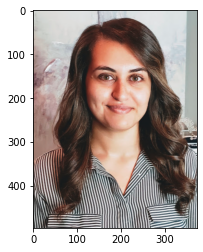

Euclidean Distance: 18723.58203125
0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


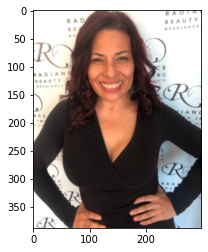

Euclidean Distance: 22582.72265625
0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


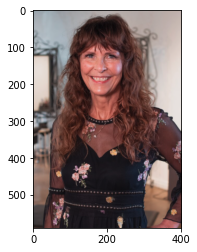

Euclidean Distance: 22955.833984375
0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


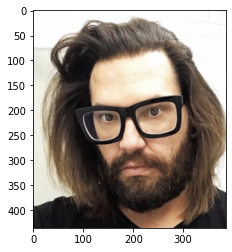

Euclidean Distance: 23968.212890625
0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


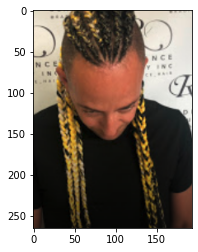

Euclidean Distance: 23980.48046875
0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


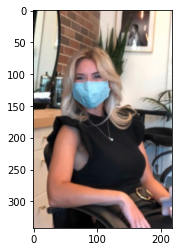

Euclidean Distance: 24092.1171875
0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


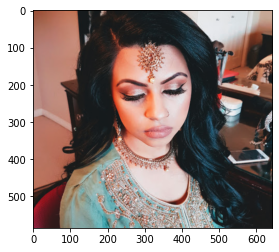

Euclidean Distance: 24251.525390625
0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


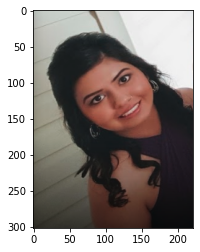

Euclidean Distance: 24458.62890625
0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


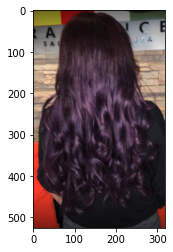

Euclidean Distance: 24801.9375
0               Bobbypinned 2021-08-07 at 7.29.25 PM.png
1            Radiance Salon 2021-08-07 at 3.39.58 PM.png
2               josefsalibasalon - Jennifer Ambridge.png
3                Shag Salon 2021-08-06 at 7.09.05 PM.png
4            Radiance Salon 2021-08-07 at 3.42.30 PM.png
                             ...                        
671       HeadKandi Salons 2021-08-06 at 10.33.31 PM.png
672         Honey Hairsalon 2021-08-06 at 8.20.59 PM.png
673              MaddPretty 2021-08-07 at 7.49.13 PM.png
674      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
675    Shag Salon - Courtney 2021-08-06 at 8.03.11 PM...
Name: img, Length: 676, dtype: object


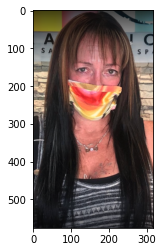

Euclidean Distance: 25303.212890625


In [54]:
# Calculate eucledian distance
img_similarity = []
cat_similarity = []


# Get actual image embedding
img = img_to_array(img) / 255.0
print(img)

img = np.expand_dims(img, axis=0)
pred = latent_space_model.predict(img)
pred = np.resize(pred, (16))
#img_cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
#print('Image Category: {}'.format(img_cat))


for i in tqdm(range(len(embeddings['indices']))):
  img_name = embeddings['indices'][i]

  # Calculate vectors distances
  dist = eucledian_distance(pred,embeddings['features'][i])
  img_similarity.append(dist)

  # Calculate categoy similarity
  #cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
  #cat_sim = category_similarity(img_cat, cat)
  #cat_similarity.append(cat_sim)

imgs_result = pd.DataFrame({'img': embeddings['indices'],
                            'euclidean_distance': img_similarity,
                            #'category_similarity': cat_similarity
                            }
                           )


imgs_result = imgs_result.query('euclidean_distance > 0').sort_values(by='euclidean_distance', ascending=True).reset_index(drop=True)
#imgs_result = imgs_result.iloc[0:20,:].sort_values(by='category_similarity', ascending=False).reset_index(drop=True)

# Show 10 first similar images
for i in range(10):
  image = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(imgs_result['img'].values[i]))
  #category = metadata.query("id == '{}'".format(imgs_result['img'].values[i].replace('.jpg','')))['category'].values[0]
  
  # Show image
  print(imgs_result['img'])
  plt.imshow(image)
  plt.show()
  #print('Image Category: {}'.format(category))
  print('Euclidean Distance: {}'.format(imgs_result['euclidean_distance'].values[i]))
  #print('Category Distance: {}'.format(imgs_result['category_similarity'].values[i]))



# Image Similarity - Validation Data (curly 2)

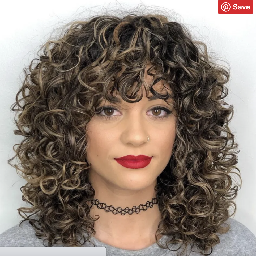

In [55]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Curly hair')[21]
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Curly hair/{}'.format(img_name), target_size=(256, 256))
img

In [56]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Curly hair')[21]
print(img_name)
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Curly hair/{}'.format(img_name), target_size=(256, 256))

Screen Shot 2021-08-06 at 1.29.14 PM.png


[[[1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]]

 [[1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [0.99607843 1.         1.        ]]

 [[1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [0.99607843 1.         1.        ]]

 ...

 [[0.8392157  0.84705883 0.8627451 ]
  [0.8392157  0.84705883 0.8627451 ]
  [0.8392157  0.84705883 0.8627451 ]
  ...
  [0.7176471  0.7294118  0.75686276]
  [0.67058825 0.68235296 0.7137255 ]
  [0.6784314  0.6862745  0.72156864]]

 [[0.83137256 0.8392157  0.85490197]
  [0.83137256 0.8392157  0.85490197]



0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


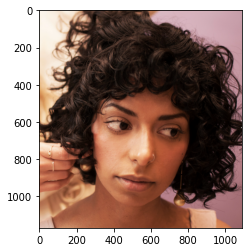

Euclidean Distance: 18553.498046875
0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


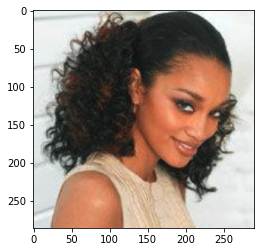

Euclidean Distance: 20415.53515625
0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


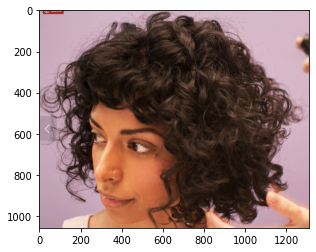

Euclidean Distance: 20446.46875
0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


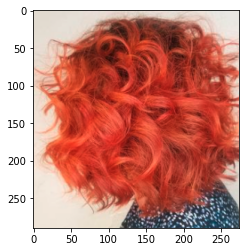

Euclidean Distance: 20509.31640625
0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


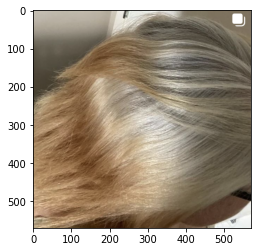

Euclidean Distance: 20717.404296875
0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


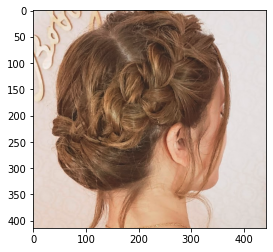

Euclidean Distance: 21161.2109375
0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


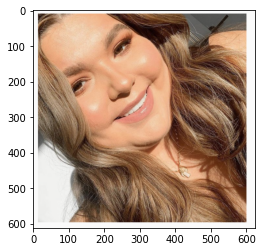

Euclidean Distance: 21517.662109375
0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


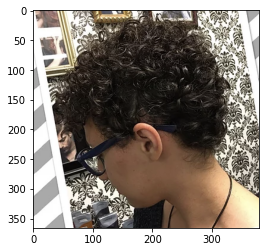

Euclidean Distance: 21651.3125
0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


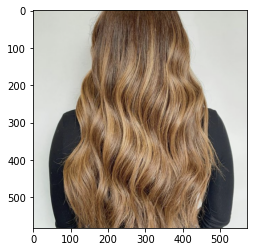

Euclidean Distance: 21824.4609375
0        HeadKandi Salons 2021-08-06 at 10.29.33 PM.png
1           Radiance Salon 2021-08-07 at 3.36.31 PM.png
2        HeadKandi Salons 2021-08-06 at 10.29.21 PM.png
3      Brianna Hallet Hair 2021-08-07 at 8.28.54 PM.png
4               Shag Salon 2021-08-06 at 7.12.24 PM.png
                             ...                       
671             MaddPretty 2021-08-07 at 7.49.13 PM.png
672               Top Knot 2021-08-07 at 7.21.28 PM.png
673             MaddPretty 2021-08-07 at 7.49.49 PM.png
674            Bobbypinned 2021-08-07 at 7.35.01 PM.png
675            Bobbypinned 2021-08-07 at 7.33.14 PM.png
Name: img, Length: 676, dtype: object


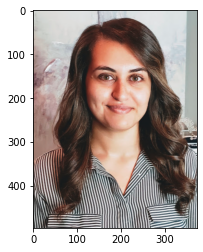

Euclidean Distance: 21848.6640625


In [57]:
# Calculate eucledian distance
img_similarity = []
cat_similarity = []


# Get actual image embedding
img = img_to_array(img) / 255.0
print(img)

img = np.expand_dims(img, axis=0)
pred = latent_space_model.predict(img)
pred = np.resize(pred, (16))
#img_cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
#print('Image Category: {}'.format(img_cat))


for i in tqdm(range(len(embeddings['indices']))):
  img_name = embeddings['indices'][i]

  # Calculate vectors distances
  dist = eucledian_distance(pred,embeddings['features'][i])
  img_similarity.append(dist)

  # Calculate categoy similarity
  #cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
  #cat_sim = category_similarity(img_cat, cat)
  #cat_similarity.append(cat_sim)

imgs_result = pd.DataFrame({'img': embeddings['indices'],
                            'euclidean_distance': img_similarity,
                            #'category_similarity': cat_similarity
                            }
                           )


imgs_result = imgs_result.query('euclidean_distance > 0').sort_values(by='euclidean_distance', ascending=True).reset_index(drop=True)
#imgs_result = imgs_result.iloc[0:20,:].sort_values(by='category_similarity', ascending=False).reset_index(drop=True)

# Show 10 first similar images
for i in range(10):
  image = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(imgs_result['img'].values[i]))
  #category = metadata.query("id == '{}'".format(imgs_result['img'].values[i].replace('.jpg','')))['category'].values[0]
  
  # Show image
  print(imgs_result['img'])
  plt.imshow(image)
  plt.show()
  #print('Image Category: {}'.format(category))
  print('Euclidean Distance: {}'.format(imgs_result['euclidean_distance'].values[i]))
  #print('Category Distance: {}'.format(imgs_result['category_similarity'].values[i]))



# Curly Hair test 3

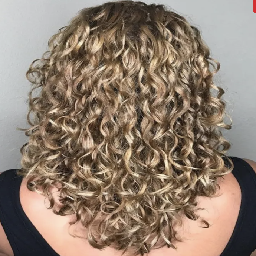

In [58]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Curly hair')[70]
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Curly hair/{}'.format(img_name), target_size=(256, 256))
img

In [59]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/straight_and_curly_validation/Curly hair')[70]
print(img_name)
img = load_img('/content/drive/MyDrive/straight_and_curly_validation/Curly hair/{}'.format(img_name), target_size=(256, 256))

Screen Shot 2021-08-06 at 1.41.23 PM.png


[[[0.827451   0.8352941  0.83137256]
  [0.83137256 0.8392157  0.8352941 ]
  [0.8352941  0.8392157  0.8392157 ]
  ...
  [0.8039216  0.20784314 0.21568628]
  [0.827451   0.1764706  0.18431373]
  [0.827451   0.1764706  0.18431373]]

 [[0.83137256 0.8392157  0.8352941 ]
  [0.83137256 0.8392157  0.8352941 ]
  [0.8352941  0.8392157  0.8392157 ]
  ...
  [0.8117647  0.19607843 0.20392157]
  [0.827451   0.1764706  0.18431373]
  [0.827451   0.1764706  0.18431373]]

 [[0.8392157  0.84705883 0.84313726]
  [0.8352941  0.84313726 0.8392157 ]
  [0.8352941  0.8392157  0.8392157 ]
  ...
  [0.8117647  0.19607843 0.20392157]
  [0.827451   0.1764706  0.18431373]
  [0.827451   0.1764706  0.18431373]]

 ...

 [[0.47058824 0.36862746 0.3254902 ]
  [0.4509804  0.34901962 0.30588236]
  [0.41960785 0.31764707 0.27450982]
  ...
  [0.47843137 0.38039216 0.32156864]
  [0.4862745  0.38039216 0.32156864]
  [0.4862745  0.38039216 0.32941177]]

 [[0.47843137 0.36862746 0.32941177]
  [0.47843137 0.36862746 0.32941177]



0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


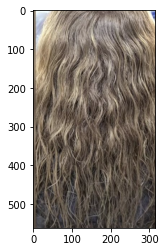

Euclidean Distance: 13825.1455078125
0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


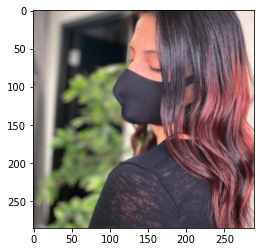

Euclidean Distance: 15471.4658203125
0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


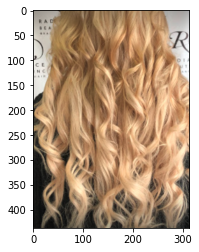

Euclidean Distance: 15517.1396484375
0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


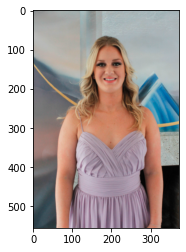

Euclidean Distance: 15584.2666015625
0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


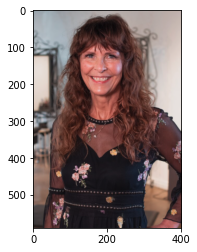

Euclidean Distance: 15606.78125
0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


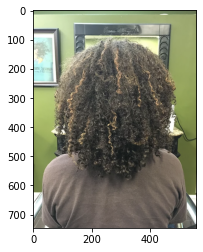

Euclidean Distance: 15612.3310546875
0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


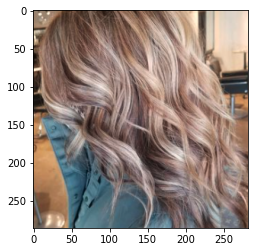

Euclidean Distance: 15861.69140625
0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


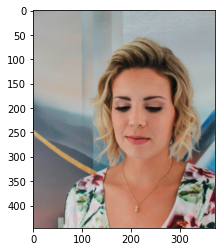

Euclidean Distance: 15908.2646484375
0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


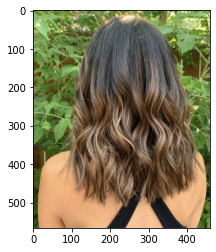

Euclidean Distance: 16010.3779296875
0      RedBloom Bridgeland Lorie 2021-08-06 at 11.04....
1      The Refinery Salon Cecilia 2021-08-07 at 3.22....
2            Radiance Salon 2021-08-07 at 4.06.39 PM.png
3      Trinity Hair and Makeup 2021-08-07 at 7.39.54 ...
4               josefsalibasalon - Jennifer Ambridge.png
                             ...                        
671      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
672             King Barber 2021-08-07 at 7.58.40 PM.png
673          Radiance Salon 2021-08-07 at 4.00.57 PM.png
674              MaddPretty 2021-08-07 at 7.52.20 PM.png
675          Radiance Salon 2021-08-07 at 4.01.09 PM.png
Name: img, Length: 676, dtype: object


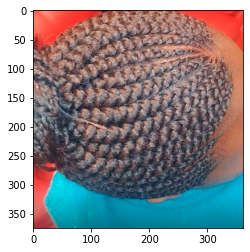

Euclidean Distance: 16017.068359375


In [60]:
# Calculate eucledian distance
img_similarity = []
cat_similarity = []


# Get actual image embedding
img = img_to_array(img) / 255.0
print(img)

img = np.expand_dims(img, axis=0)
pred = latent_space_model.predict(img)
pred = np.resize(pred, (16))
#img_cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
#print('Image Category: {}'.format(img_cat))


for i in tqdm(range(len(embeddings['indices']))):
  img_name = embeddings['indices'][i]

  # Calculate vectors distances
  dist = eucledian_distance(pred,embeddings['features'][i])
  img_similarity.append(dist)

  # Calculate categoy similarity
  #cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
  #cat_sim = category_similarity(img_cat, cat)
  #cat_similarity.append(cat_sim)

imgs_result = pd.DataFrame({'img': embeddings['indices'],
                            'euclidean_distance': img_similarity,
                            #'category_similarity': cat_similarity
                            }
                           )


imgs_result = imgs_result.query('euclidean_distance > 0').sort_values(by='euclidean_distance', ascending=True).reset_index(drop=True)
#imgs_result = imgs_result.iloc[0:20,:].sort_values(by='category_similarity', ascending=False).reset_index(drop=True)

# Show 10 first similar images
for i in range(10):
  image = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(imgs_result['img'].values[i]))
  #category = metadata.query("id == '{}'".format(imgs_result['img'].values[i].replace('.jpg','')))['category'].values[0]
  
  # Show image
  print(imgs_result['img'])
  plt.imshow(image)
  plt.show()
  #print('Image Category: {}'.format(category))
  print('Euclidean Distance: {}'.format(imgs_result['euclidean_distance'].values[i]))
  #print('Category Distance: {}'.format(imgs_result['category_similarity'].values[i]))



# Prediction Hair Test

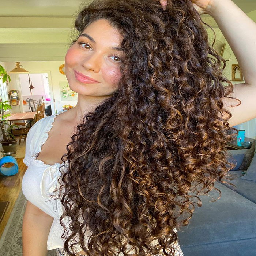

In [61]:

# Get new prediction image
new_img_name = os.listdir('/content/drive/MyDrive/prediction_photos')[0]
new_img = load_img('/content/drive/MyDrive/prediction_photos/{}'.format( new_img_name), target_size=(256, 256))
new_img

In [62]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/prediction_photos')[0]
print(img_name)
img = load_img('/content/drive/MyDrive/prediction_photos/{}'.format(img_name), target_size=(256, 256))

long-curly-hair.jpg


[[[0.6745098  0.6509804  0.4627451 ]
  [0.67058825 0.64705884 0.45882353]
  [0.6745098  0.6509804  0.4627451 ]
  ...
  [0.5058824  0.5176471  0.34117648]
  [0.5058824  0.5176471  0.34117648]
  [0.5019608  0.5137255  0.3372549 ]]

 [[0.6862745  0.6627451  0.4745098 ]
  [0.68235296 0.65882355 0.47058824]
  [0.6862745  0.6627451  0.4745098 ]
  ...
  [0.5137255  0.50980395 0.32941177]
  [0.5137255  0.50980395 0.32941177]
  [0.5137255  0.50980395 0.32941177]]

 [[0.6901961  0.6666667  0.47843137]
  [0.69411767 0.67058825 0.48235294]
  [0.69803923 0.6745098  0.4862745 ]
  ...
  [0.5254902  0.5176471  0.32941177]
  [0.5254902  0.5176471  0.32941177]
  [0.5254902  0.5176471  0.32941177]]

 ...

 [[0.49411765 0.47058824 0.36862746]
  [0.49411765 0.47058824 0.36862746]
  [0.42352942 0.4        0.29803923]
  ...
  [0.2509804  0.38431373 0.49019608]
  [0.24705882 0.38039216 0.4862745 ]
  [0.28235295 0.41568628 0.52156866]]

 [[0.46666667 0.44313726 0.34117648]
  [0.47058824 0.44705883 0.34509805]



0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


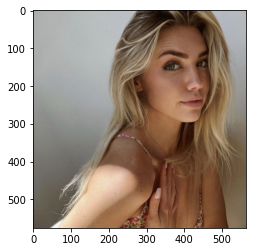

Euclidean Distance: 17353.787109375
0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


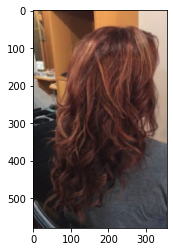

Euclidean Distance: 18042.4140625
0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


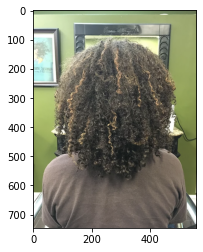

Euclidean Distance: 18057.912109375
0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


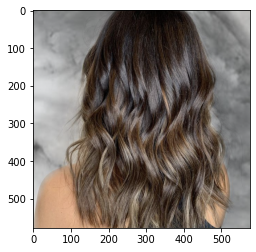

Euclidean Distance: 18475.296875
0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


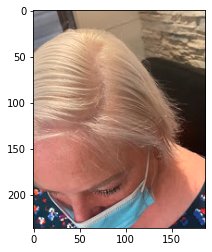

Euclidean Distance: 18538.45703125
0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


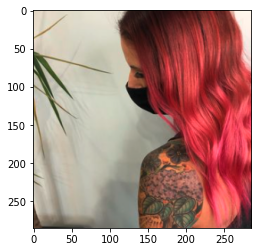

Euclidean Distance: 18657.048828125
0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


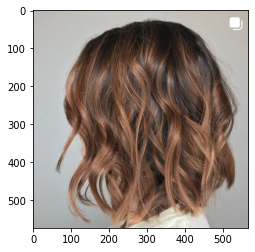

Euclidean Distance: 18684.724609375
0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


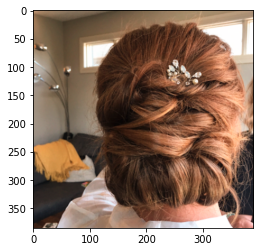

Euclidean Distance: 18698.271484375
0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


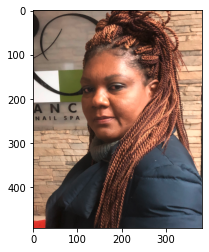

Euclidean Distance: 18723.861328125
0      Shag Salon - Courtney 2021-08-06 at 8.02.48 PM...
1              Iconic Salon 2021-08-07 at 8.16.44 PM.png
2           Honey Hairsalon 2021-08-06 at 8.22.52 PM.png
3      Shag Salon - Courtney 2021-08-06 at 8.03.43 PM...
4            Radiance Salon 2021-08-07 at 4.12.17 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.14.29 PM.png
672    Trinity Hair and Makeup 2021-08-07 at 7.38.59 ...
673          Radiance Salon 2021-08-07 at 4.01.09 PM.png
674              Shag Salon 2021-08-06 at 7.14.31 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


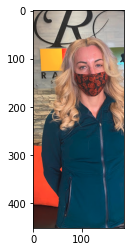

Euclidean Distance: 18730.189453125


In [63]:
# Calculate eucledian distance
img_similarity = []
cat_similarity = []


# Get actual image embedding
img = img_to_array(img) / 255.0
print(img)

img = np.expand_dims(img, axis=0)
pred = latent_space_model.predict(img)
pred = np.resize(pred, (16))
#img_cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
#print('Image Category: {}'.format(img_cat))


for i in tqdm(range(len(embeddings['indices']))):
  img_name = embeddings['indices'][i]

  # Calculate vectors distances
  dist = eucledian_distance(pred,embeddings['features'][i])
  img_similarity.append(dist)

  # Calculate categoy similarity
  #cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
  #cat_sim = category_similarity(img_cat, cat)
  #cat_similarity.append(cat_sim)

imgs_result = pd.DataFrame({'img': embeddings['indices'],
                            'euclidean_distance': img_similarity,
                            #'category_similarity': cat_similarity
                            }
                           )


imgs_result = imgs_result.query('euclidean_distance > 0').sort_values(by='euclidean_distance', ascending=True).reset_index(drop=True)
#imgs_result = imgs_result.iloc[0:20,:].sort_values(by='category_similarity', ascending=False).reset_index(drop=True)

# Show 10 first similar images
for i in range(10):
  image = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(imgs_result['img'].values[i]))
  #category = metadata.query("id == '{}'".format(imgs_result['img'].values[i].replace('.jpg','')))['category'].values[0]
  
  # Show image
  print(imgs_result['img'])
  plt.imshow(image)
  plt.show()
  #print('Image Category: {}'.format(category))
  print('Euclidean Distance: {}'.format(imgs_result['euclidean_distance'].values[i]))
  #print('Category Distance: {}'.format(imgs_result['category_similarity'].values[i]))



# Short Hair Test

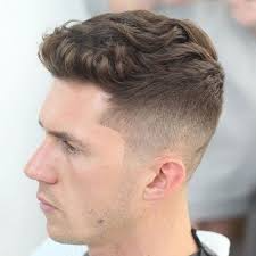

In [67]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/Curl_Types/short')[71]
new_img = load_img('/content/drive/MyDrive/Curl_Types/short/{}'.format( img_name), target_size=(256, 256))
new_img

In [68]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/Curl_Types/short')[70]
print(img_name)
img = load_img('/content/drive/MyDrive/Curl_Types/short/{}'.format(img_name), target_size=(256, 256))

image16(2).png


[[[0.09019608 0.10196079 0.07450981]
  [0.09411765 0.10588235 0.07843138]
  [0.09411765 0.10588235 0.07843138]
  ...
  [0.17254902 0.18431373 0.18431373]
  [0.17254902 0.18431373 0.18431373]
  [0.1882353  0.19607843 0.1882353 ]]

 [[0.09803922 0.10980392 0.08235294]
  [0.10196079 0.11372549 0.08627451]
  [0.10196079 0.11372549 0.08627451]
  ...
  [0.17254902 0.18431373 0.18431373]
  [0.17254902 0.18431373 0.18431373]
  [0.1882353  0.19607843 0.1882353 ]]

 [[0.10980392 0.11764706 0.09803922]
  [0.10980392 0.11764706 0.09803922]
  [0.10980392 0.11764706 0.09803922]
  ...
  [0.16862746 0.18039216 0.18039216]
  [0.16862746 0.18039216 0.18039216]
  [0.18431373 0.19215687 0.18431373]]

 ...

 [[0.26666668 0.27450982 0.27058825]
  [0.2784314  0.28627452 0.28235295]
  [0.2784314  0.28627452 0.28235295]
  ...
  [0.34117648 0.34117648 0.34117648]
  [0.34117648 0.34117648 0.34117648]
  [0.3372549  0.3372549  0.3372549 ]]

 [[0.26666668 0.27450982 0.27058825]
  [0.2784314  0.28627452 0.28235295]



0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


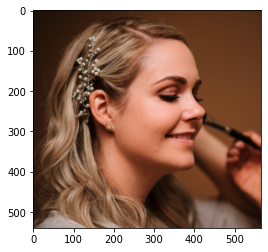

Euclidean Distance: 17782.892578125
0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


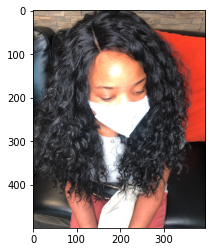

Euclidean Distance: 17989.51171875
0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


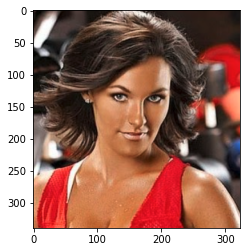

Euclidean Distance: 18223.443359375
0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


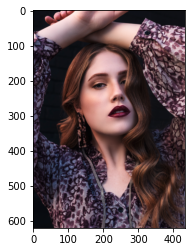

Euclidean Distance: 18464.494140625
0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


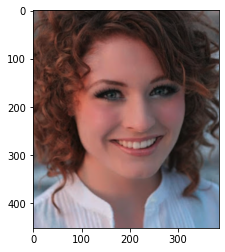

Euclidean Distance: 18537.03125
0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


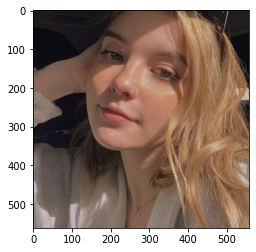

Euclidean Distance: 18886.982421875
0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


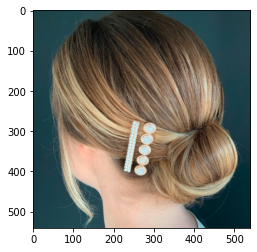

Euclidean Distance: 19213.978515625
0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


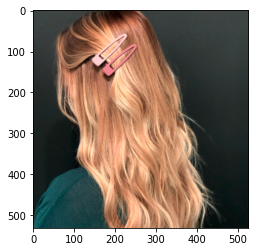

Euclidean Distance: 19348.251953125
0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


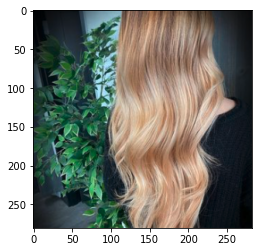

Euclidean Distance: 19450.166015625
0      Trinity Hair and Makeup 2021-08-07 at 7.43.31 ...
1            Radiance Salon 2021-08-07 at 4.05.37 PM.png
2                MaddPretty 2021-08-07 at 7.51.25 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.08.11 PM.png
4                MaddPretty 2021-08-07 at 7.51.53 PM.png
                             ...                        
671      Diva Salon and Spa 2021-08-07 at 7.09.36 PM.png
672      Shag Salon - Carly 2021-08-06 at 7.51.18 PM.png
673            Iconic Salon 2021-08-07 at 8.18.21 PM.png
674       HeadKandi Salons 2021-08-06 at 10.30.31 PM.png
675      Shag Salon - Carly 2021-08-06 at 7.50.31 PM.png
Name: img, Length: 676, dtype: object


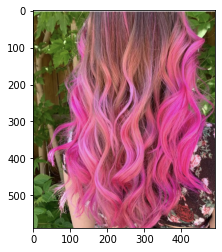

Euclidean Distance: 19479.2109375


In [69]:
# Calculate eucledian distance
img_similarity = []
cat_similarity = []


# Get actual image embedding
img = img_to_array(img) / 255.0
print(img)

img = np.expand_dims(img, axis=0)
pred = latent_space_model.predict(img)
pred = np.resize(pred, (16))
#img_cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
#print('Image Category: {}'.format(img_cat))


for i in tqdm(range(len(embeddings['indices']))):
  img_name = embeddings['indices'][i]

  # Calculate vectors distances
  dist = eucledian_distance(pred,embeddings['features'][i])
  img_similarity.append(dist)

  # Calculate categoy similarity
  #cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
  #cat_sim = category_similarity(img_cat, cat)
  #cat_similarity.append(cat_sim)

imgs_result = pd.DataFrame({'img': embeddings['indices'],
                            'euclidean_distance': img_similarity,
                            #'category_similarity': cat_similarity
                            }
                           )


imgs_result = imgs_result.query('euclidean_distance > 0').sort_values(by='euclidean_distance', ascending=True).reset_index(drop=True)
#imgs_result = imgs_result.iloc[0:20,:].sort_values(by='category_similarity', ascending=False).reset_index(drop=True)

# Show 10 first similar images
for i in range(10):
  image = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(imgs_result['img'].values[i]))
  #category = metadata.query("id == '{}'".format(imgs_result['img'].values[i].replace('.jpg','')))['category'].values[0]
  
  # Show image
  print(imgs_result['img'])
  plt.imshow(image)
  plt.show()
  #print('Image Category: {}'.format(category))
  print('Euclidean Distance: {}'.format(imgs_result['euclidean_distance'].values[i]))
  #print('Category Distance: {}'.format(imgs_result['category_similarity'].values[i]))



# Prediction Hair Test

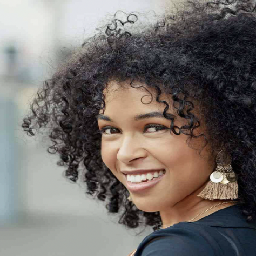

In [70]:

# Get new prediction image
new_img_name = os.listdir('/content/drive/MyDrive/prediction_photos')[6]
new_img = load_img('/content/drive/MyDrive/prediction_photos/{}'.format( new_img_name), target_size=(256, 256))
new_img

In [71]:
# Get image name
img_name = os.listdir('/content/drive/MyDrive/prediction_photos')[6]
print(img_name)
img = load_img('/content/drive/MyDrive/prediction_photos/{}'.format(img_name), target_size=(256, 256))

Screen Shot 2021-08-09 at 11.05.57 AM.png


[[[0.9254902  0.92941177 0.9137255 ]
  [0.92156863 0.92941177 0.9098039 ]
  [0.9254902  0.92941177 0.9137255 ]
  ...
  [0.4509804  0.4509804  0.44705883]
  [0.53333336 0.53333336 0.5294118 ]
  [0.6156863  0.6156863  0.6156863 ]]

 [[0.9254902  0.92941177 0.9137255 ]
  [0.9254902  0.93333334 0.9137255 ]
  [0.9254902  0.92941177 0.9137255 ]
  ...
  [0.4745098  0.4745098  0.4745098 ]
  [0.54509807 0.54509807 0.5411765 ]
  [0.5686275  0.5686275  0.5647059 ]]

 [[0.9137255  0.91764706 0.90588236]
  [0.92156863 0.9254902  0.90588236]
  [0.92156863 0.92941177 0.91764706]
  ...
  [0.5411765  0.5372549  0.54509807]
  [0.50980395 0.5176471  0.50980395]
  [0.43529412 0.4392157  0.43529412]]

 ...

 [[0.6431373  0.65882355 0.6392157 ]
  [0.6431373  0.65882355 0.6392157 ]
  [0.6431373  0.65882355 0.6392157 ]
  ...
  [0.09411765 0.14117648 0.20392157]
  [0.09411765 0.14117648 0.20392157]
  [0.07450981 0.12941177 0.1882353 ]]

 [[0.6431373  0.654902   0.6392157 ]
  [0.64705884 0.65882355 0.6392157 ]



0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


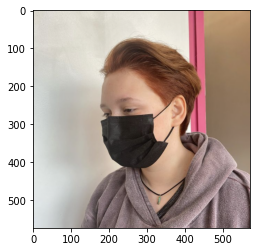

Euclidean Distance: 19850.2265625
0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


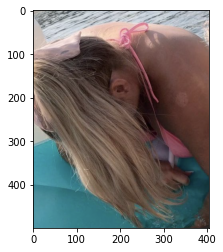

Euclidean Distance: 19941.2109375
0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


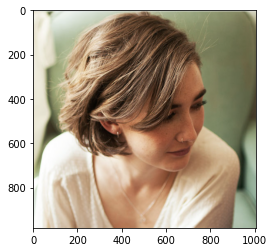

Euclidean Distance: 20440.041015625
0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


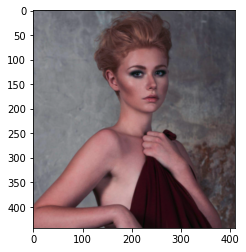

Euclidean Distance: 20567.6171875
0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


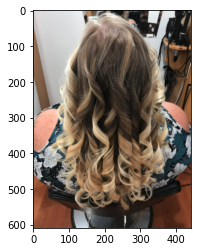

Euclidean Distance: 20596.291015625
0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


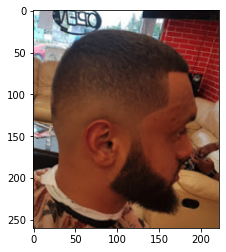

Euclidean Distance: 21242.119140625
0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


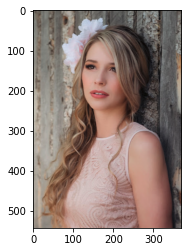

Euclidean Distance: 21432.13671875
0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


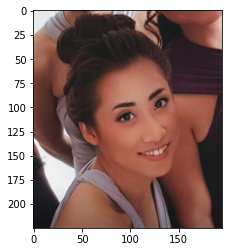

Euclidean Distance: 21657.560546875
0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


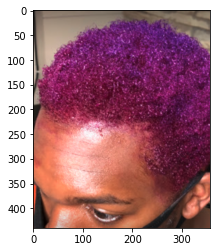

Euclidean Distance: 21806.71875
0      Shag Salon - Angela A 2021-08-06 at 7.33.40 PM...
1                Shag Salon 2021-08-06 at 7.10.11 PM.png
2         HeadKandi Salons 2021-08-06 at 10.33.10 PM.png
3        Diva Salon and Spa 2021-08-07 at 7.11.36 PM.png
4              Iconic Salon 2021-08-07 at 8.20.53 PM.png
                             ...                        
671    RedBloom Bridgeland Alannah 2021-08-06 at 11.0...
672    Shag Salon - Courtney 2021-08-06 at 7.59.40 PM...
673                Top Knot 2021-08-07 at 7.18.43 PM.png
674    Shag Salon - Jillian 2021-08-06 at 8.10.22 PM.png
675            Meili Beauty 2021-08-07 at 7.46.39 PM.png
Name: img, Length: 676, dtype: object


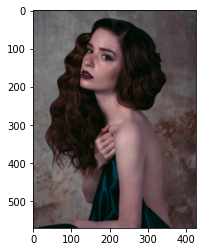

Euclidean Distance: 21979.9765625


In [72]:
# Calculate eucledian distance
img_similarity = []
cat_similarity = []


# Get actual image embedding
img = img_to_array(img) / 255.0
print(img)

img = np.expand_dims(img, axis=0)
pred = latent_space_model.predict(img)
pred = np.resize(pred, (16))
#img_cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
#print('Image Category: {}'.format(img_cat))


for i in tqdm(range(len(embeddings['indices']))):
  img_name = embeddings['indices'][i]

  # Calculate vectors distances
  dist = eucledian_distance(pred,embeddings['features'][i])
  img_similarity.append(dist)

  # Calculate categoy similarity
  #cat = metadata.query("id == '{}'".format(img_name.replace('.jpg','')))['category'].values[0]
  #cat_sim = category_similarity(img_cat, cat)
  #cat_similarity.append(cat_sim)

imgs_result = pd.DataFrame({'img': embeddings['indices'],
                            'euclidean_distance': img_similarity,
                            #'category_similarity': cat_similarity
                            }
                           )


imgs_result = imgs_result.query('euclidean_distance > 0').sort_values(by='euclidean_distance', ascending=True).reset_index(drop=True)
#imgs_result = imgs_result.iloc[0:20,:].sort_values(by='category_similarity', ascending=False).reset_index(drop=True)

# Show 10 first similar images
for i in range(10):
  image = load_img('/content/drive/MyDrive/Salon_photos_all/{}'.format(imgs_result['img'].values[i]))
  #category = metadata.query("id == '{}'".format(imgs_result['img'].values[i].replace('.jpg','')))['category'].values[0]
  
  # Show image
  print(imgs_result['img'])
  plt.imshow(image)
  plt.show()
  #print('Image Category: {}'.format(category))
  print('Euclidean Distance: {}'.format(imgs_result['euclidean_distance'].values[i]))
  #print('Category Distance: {}'.format(imgs_result['category_similarity'].values[i]))

